In [ ]:
#  INSTALACIÓN DE DEPENDENCIAS

!pip install segment-anything opencv-python pytesseract transformers easyocr tqdm pandas --quiet
!pip install git+https://github.com/facebookresearch/segment-anything.git --quiet
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth -O sam_vit_b.pth

  Preparing metadata (setup.py) ... done
--2026-02-27 00:43:14--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.249.182.33, 13.249.182.62, 13.249.182.39, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.249.182.33|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 375042383 (358M) [binary/octet-stream]
Saving to: ‘sam_vit_b.pth’

sam_vit_b.pth       100%[===================>] 357.67M   360MB/s    in 1.0s    

2026-02-27 00:43:16 (360 MB/s) - ‘sam_vit_b.pth’ saved [375042383/375042383]



In [ ]:
#MONTAR GOOGLE DRIVE Y EXTRAER ZIP

from google.colab import drive
drive.mount('/content/drive')

import zipfile
import os

zip_path = "/content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/Copia de 20260121 imagenes Cashcollection1.zip"
extract_dir = "/content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet"

with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall(extract_dir)

print("ZIP extraído en:", extract_dir)

IMAGE_DIR = os.path.join(extract_dir, "20260121 imagenes Cashcollection")
print("Carpeta de imágenes:", IMAGE_DIR)

print("Ejemplo de archivos:", os.listdir(IMAGE_DIR)[:5])

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
ZIP extraído en: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet
Carpeta de imágenes: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet/20260121 imagenes Cashcollection
Ejemplo de archivos: ['7.jpg', '70.png', '71.png', '72.jpg', '75.jpeg']


In [ ]:
#IMPORTACIÓN DE LIBRERÍAS Y CONFIGURACIÓN

import cv2
import torch
import numpy as np
import pytesseract
import re
import pandas as pd
from tqdm import tqdm

from segment_anything import sam_model_registry, SamAutomaticMaskGenerator
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
import easyocr

device = "cuda" if torch.cuda.is_available() else "cpu"
print("DEVICE:", device)

DEVICE: cuda


In [ ]:
#CARGA DE MODELOS (SAM, DINO, EASYOCR)

# SAM
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b.pth").to(device)
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=16, #<----se cambio antes era 4
    pred_iou_thresh=0.6,#<----se cambio antes era 0.88
    stability_score_thresh=0.5,#<----se cambio antes era 0.90
    min_mask_region_area=50 #<----se cambio antes era 0.90
)

# DINO
processor = AutoProcessor.from_pretrained("IDEA-Research/grounding-dino-base")
dino = AutoModelForZeroShotObjectDetection.from_pretrained(
    "IDEA-Research/grounding-dino-base"
).to(device)

# EasyOCR
reader = easyocr.Reader(['es', 'en'], gpu=(device=="cuda"))

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
The image processor of type `GroundingDinoImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


Loading weights:   0%|          | 0/1206 [00:00<?, ?it/s]

In [ ]:
#FUNCIÓN DE REGEX PARA EXTRAER TEXTO

def extract_col_strict(text):
    text = text.upper()
    pattern = r"C[O0]L\s*([123])[\.\,\s]*(\d{5})\s+(\d{5})"
    matches = re.findall(pattern, text)
    return [f"COL {m[0]}. {m[1]} {m[2]}" for m in matches]



In [ ]:
#FUNCIÓN DE EXTRACCIÓN CON SAM

def sam_extract(img):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_small = cv2.resize(img_rgb, (1024, 1024))

    masks = mask_generator.generate(img_small)
    found = []

    for m in masks:
        mask = m["segmentation"].astype(np.uint8) * 255
        x, y, w, h = cv2.boundingRect(mask)
        crop = img_small[y:y+h, x:x+w]

        if crop.size == 0:
            continue

        ocr = pytesseract.image_to_string(crop)
        cleaned = extract_col_strict(ocr)
        if cleaned:
            found.extend(cleaned)

    return sorted(list(set(found)))

In [ ]:
#FUNCIÓN DE FALLBACK CON DINO

def dino_fallback(img):
    if img is None or img.size == 0:
        return []

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    #inputs = processor(images=img_rgb, text="printed text with numbers", return_tensors="pt").to(device)

    inputs = processor(images=img_rgb, text="COL number line text numbers", return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = dino(**inputs)

    results = processor.post_process_grounded_object_detection(
        outputs, inputs.input_ids,
        threshold=0.22, text_threshold=0.22,
        target_sizes=[img.shape[:2]]
    )[0]

    found = []
    h, w = img.shape[:2]

    for box in results["boxes"]:
        x1, y1, x2, y2 = map(int, box.tolist())

        x1 = max(0, min(x1, w - 1))
        x2 = max(0, min(x2, w - 1))
        y1 = max(0, min(y1, h - 1))
        y2 = max(0, min(y2, h - 1))

        if x2 <= x1 or y2 <= y1:
            continue

        crop = img[y1:y2, x1:x2]

        if crop is None or crop.size == 0:
            continue

        try:
            ocr_list = reader.readtext(crop, detail=0)
        except:
            continue

        text = " ".join(ocr_list)
        cleaned = extract_col_strict(text)

        if cleaned:
            found.extend(cleaned)

    return sorted(list(set(found)))

In [ ]:
#PIPELINE HÍBRIDO SAM → DINO

def extract_col_hybrid(img_path):
    img = cv2.imread(img_path)

    # Primero intentar con SAM
    sam_result = sam_extract(img)
    if sam_result:
        return sam_result

    # Si SAM falla → usar DINO
    return dino_fallback(img)

**NOTA: Como se menciona en los comentarios de la celda anterior este codigo funciona principalmente con OCR y SAM, en caso de que SAM no haga su funcion de recorte este tratara de utilizar DINO para obtener los resultados deseados**

In [ ]:
#PROCESAR SOLO 50 IMÁGENES + BARRA DE PROGRESO

all_images = sorted([
    f for f in os.listdir(IMAGE_DIR)
    if f.lower().endswith((".jpg", ".jpeg", ".png", ".jfif"))
])

subset_images = all_images[:50]

rows = []

for img_name in tqdm(subset_images, desc="Procesando imágenes"):
    path = os.path.join(IMAGE_DIR, img_name)
    detected = extract_col_hybrid(path)

    col1 = next((x for x in detected if x.startswith("COL 1")), "")
    col2 = next((x for x in detected if x.startswith("COL 2")), "")
    col3 = next((x for x in detected if x.startswith("COL 3")), "")

    rows.append({"imagen": img_name, "col1": col1, "col2": col2, "col3": col3})


Procesando imágenes: 100%|██████████| 50/50 [23:44<00:00, 28.49s/it]


In [ ]:
#TABLA FINAL DE RESULTADOS

df_results = pd.DataFrame(rows)
df_results.head()

,imagen,col1,col2,col3
0,1.jpeg,COL 1. 15355 50899,COL 2. 01146 94344,COL 3. 01816 44947
1,10.jpeg,,,
2,100.jpg,COL 1. 24421 29378,COL 2. 30669 56415,COL 3. 69800 86140
3,101.png,COL 1. 96476 05643,COL 2. 00069 36425,COL 3. 60880 89364
4,102.png,COL 1. 30556 59450,COL 2. 51144 64548,COL 3. 91826 13566


In [ ]:
import matplotlib.pyplot as plt

def visualize_sam_masks(img_path):
    img = cv2.imread(img_path)

    if img is None:
        print("Error: imagen no encontrada ->", img_path)
        return

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_small = cv2.resize(img_rgb, (1024, 1024))

    print("Generando máscaras SAM…")
    masks = mask_generator.generate(img_small)

    overlay = img_small.copy()

    for m in masks:
        mask = m["segmentation"]
        color = np.random.randint(0, 255, (3,), dtype=np.uint8)

        overlay[mask] = overlay[mask] * 0.4 + color * 0.6

    plt.figure(figsize=(10, 10))
    plt.imshow(overlay)
    plt.title("Máscaras SAM superpuestas")
    plt.axis("off")
    plt.show()

In [ ]:
def visualize_dino(img_path):
    img = cv2.imread(img_path)

    if img is None:
        print("Error: imagen no encontrada ->", img_path)
        return

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    inputs = processor(images=img_rgb, text="printed text", return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = dino(**inputs)

    results = processor.post_process_grounded_object_detection(
        outputs, inputs.input_ids,
        threshold=0.25, text_threshold=0.25,
        target_sizes=[img.shape[:2]]
    )[0]

    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)

    for box in results["boxes"]:
        x1, y1, x2, y2 = map(int, box.tolist())
        plt.gca().add_patch(
            plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                          fill=False, edgecolor="red", linewidth=2)
        )

    plt.title("Detecciones de DINO")
    plt.axis("off")
    plt.show()

Se seleccionaron 10 imágenes de prueba.

Procesando: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet/20260121 imagenes Cashcollection/1.jpeg
Generando máscaras SAM…


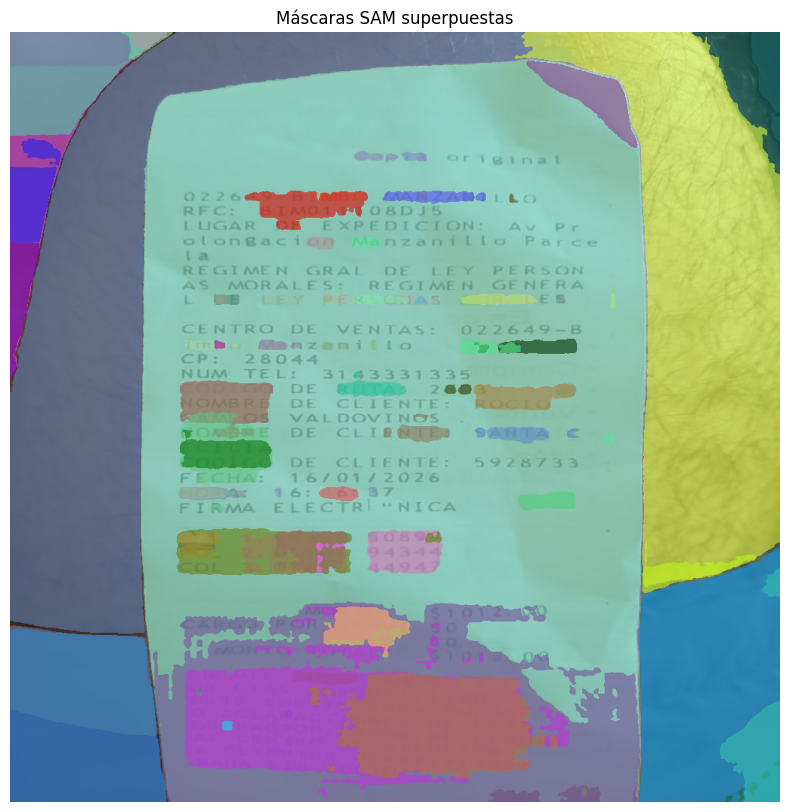

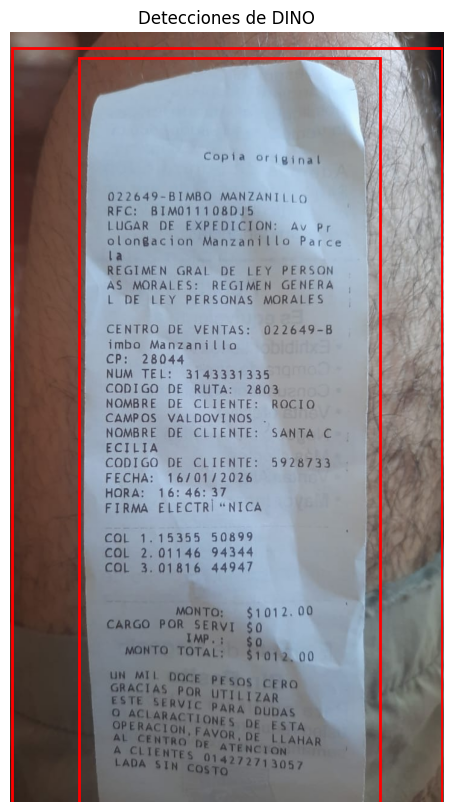

------------------------------------------------------------
Procesando: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet/20260121 imagenes Cashcollection/10.jpeg
Generando máscaras SAM…


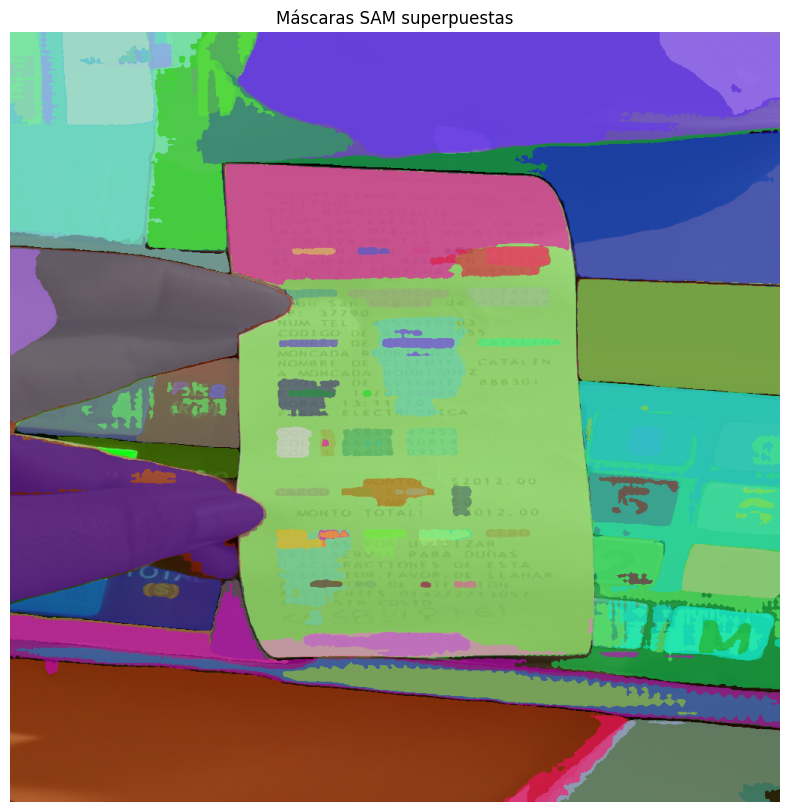

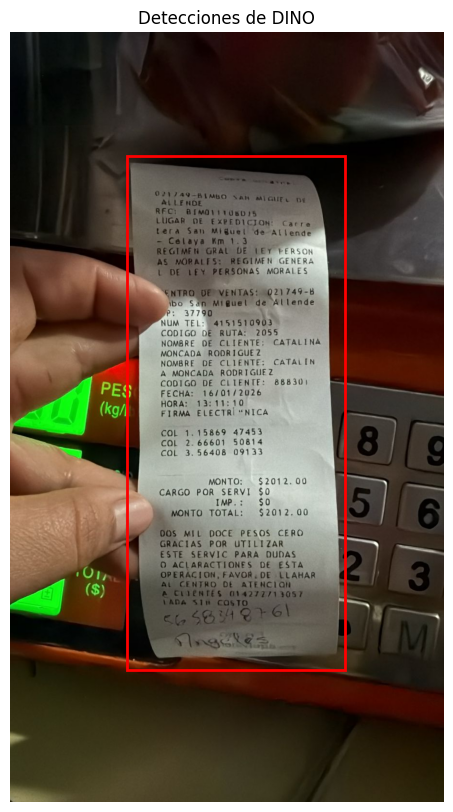

------------------------------------------------------------
Procesando: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet/20260121 imagenes Cashcollection/100.jpg
Generando máscaras SAM…


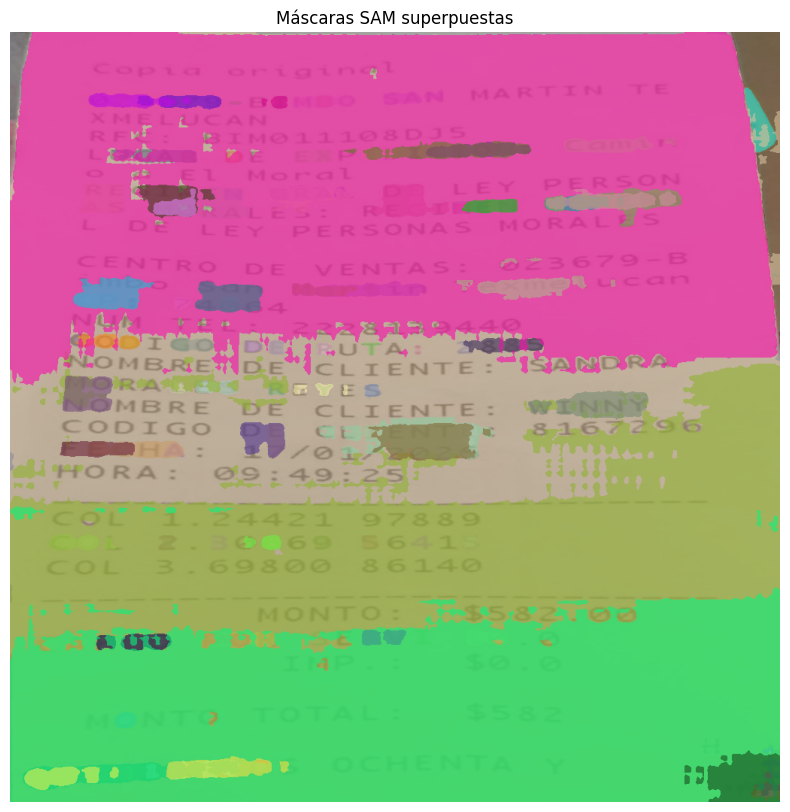

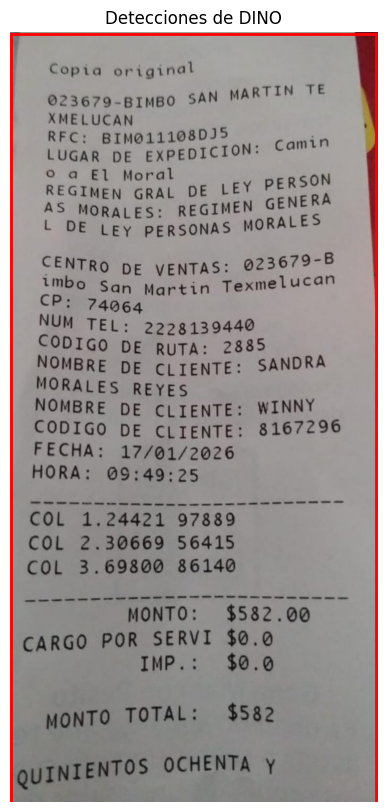

------------------------------------------------------------
Procesando: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet/20260121 imagenes Cashcollection/101.png
Generando máscaras SAM…


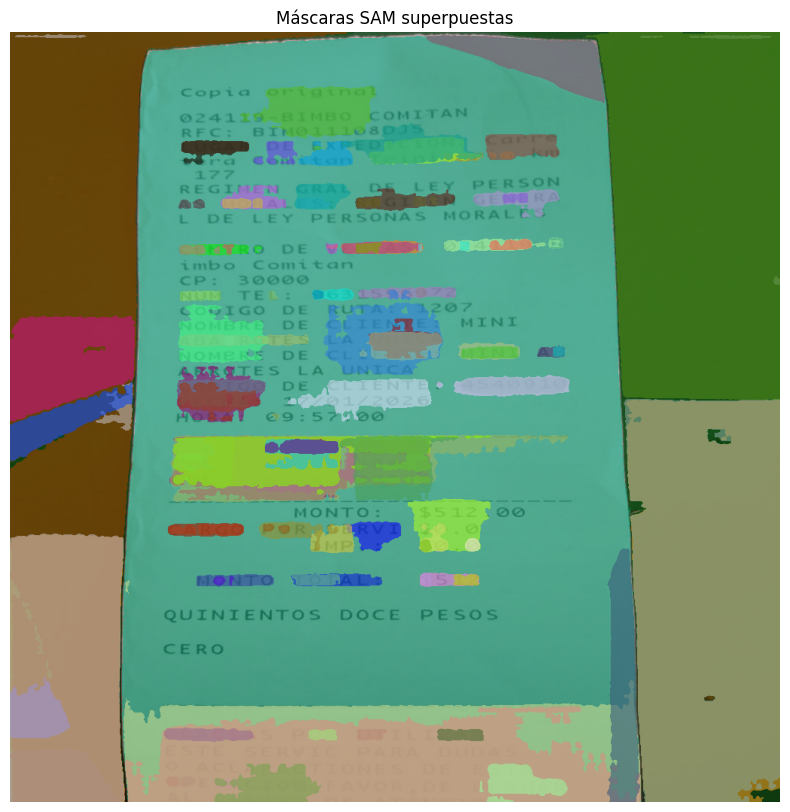

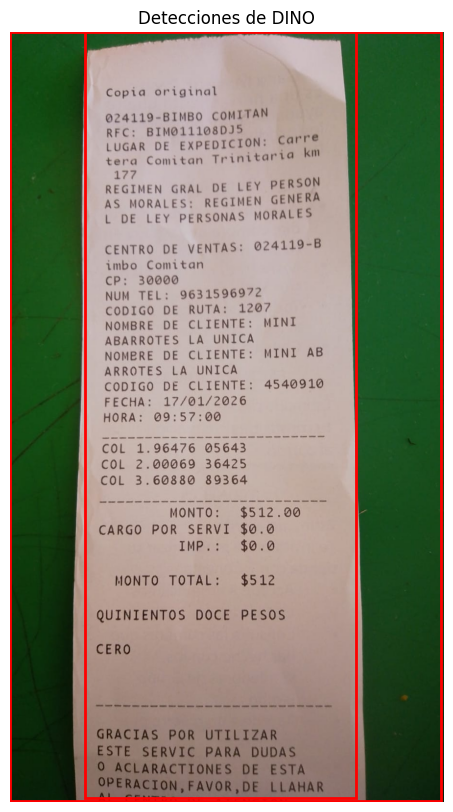

------------------------------------------------------------
Procesando: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet/20260121 imagenes Cashcollection/102.png
Generando máscaras SAM…


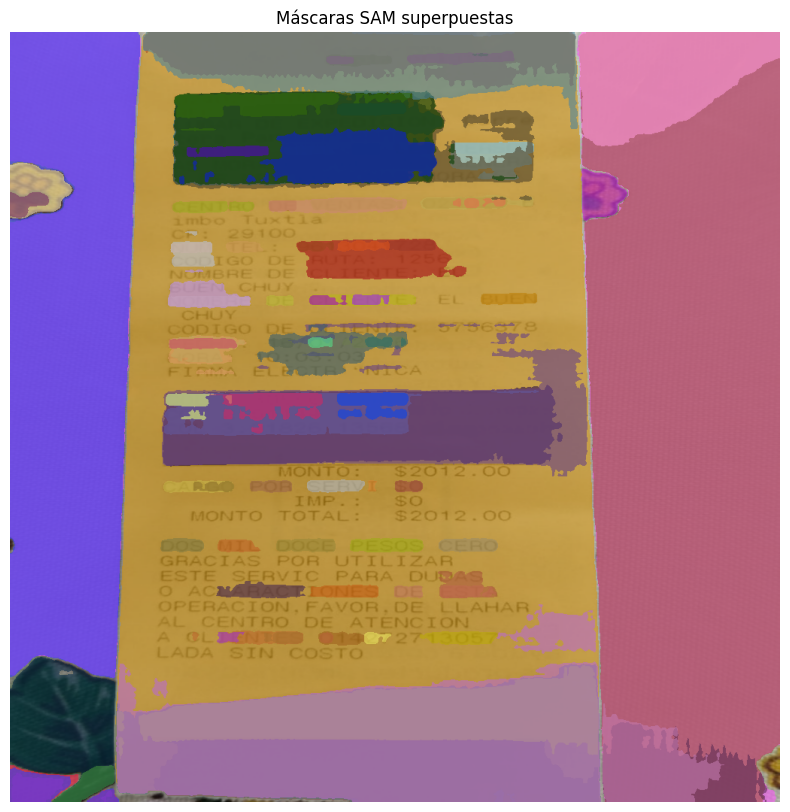

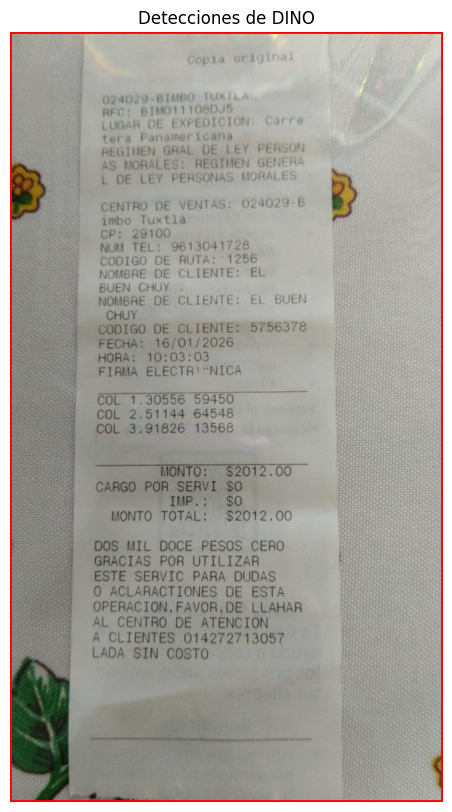

------------------------------------------------------------
Procesando: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet/20260121 imagenes Cashcollection/103.png
Generando máscaras SAM…


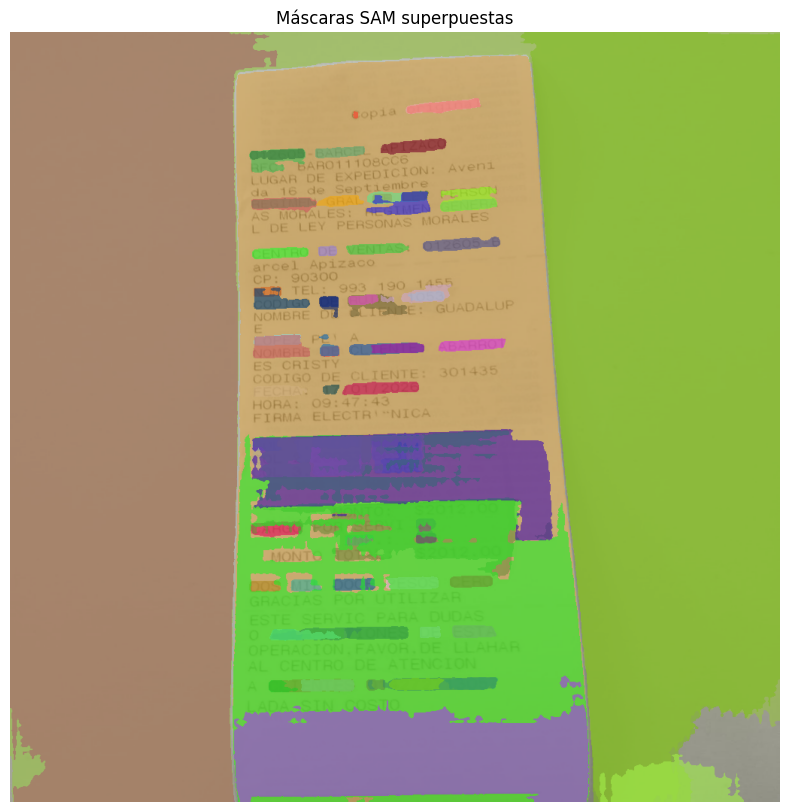

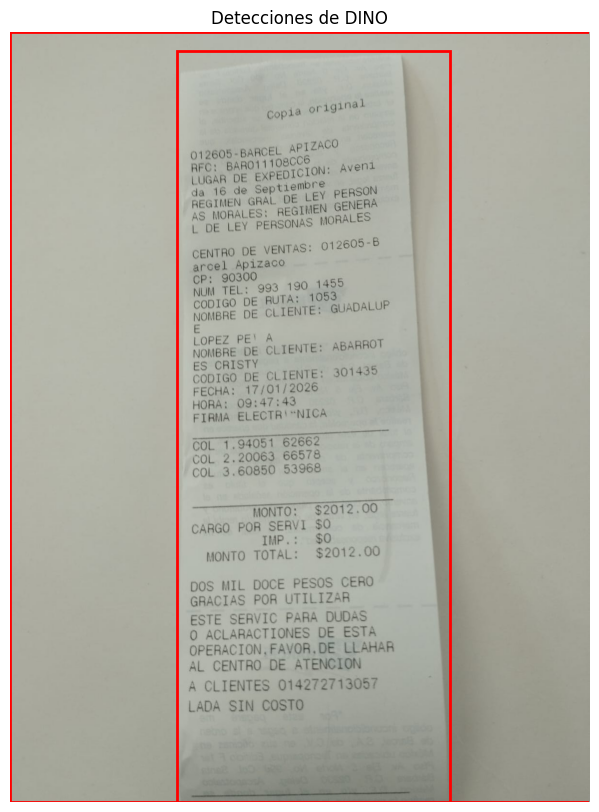

------------------------------------------------------------
Procesando: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet/20260121 imagenes Cashcollection/104.png
Generando máscaras SAM…


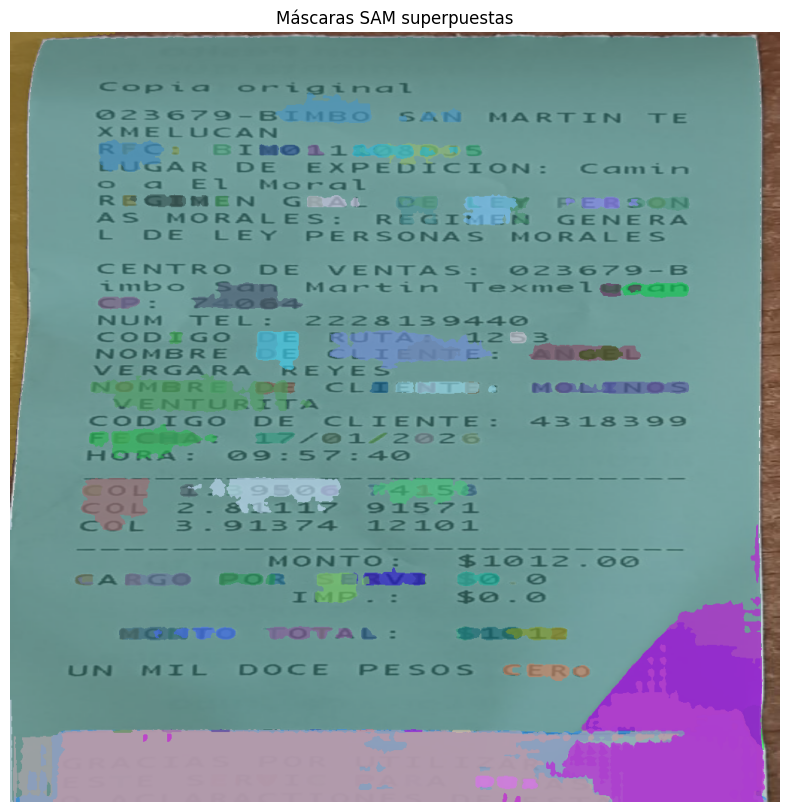

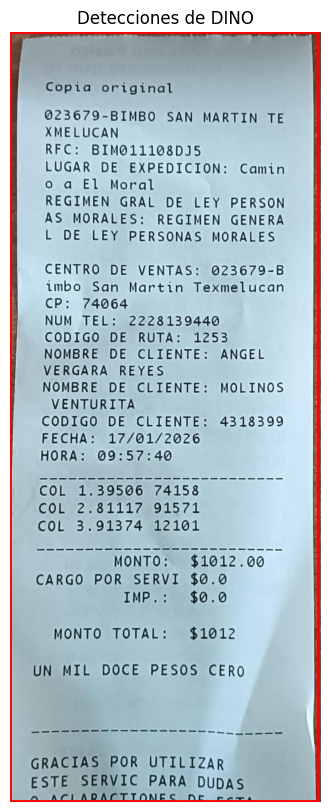

------------------------------------------------------------
Procesando: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet/20260121 imagenes Cashcollection/105.png
Generando máscaras SAM…


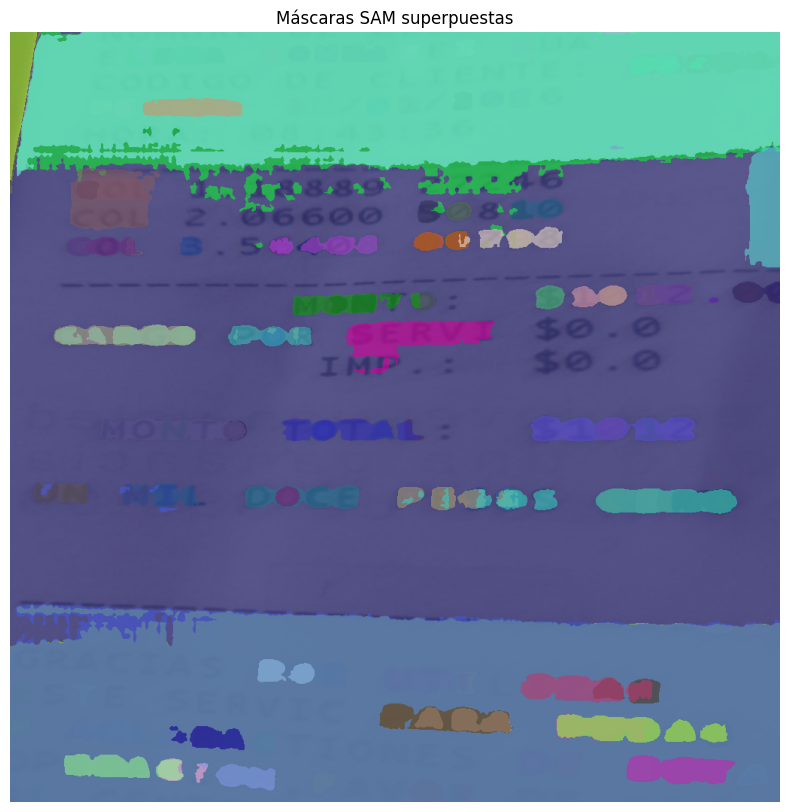

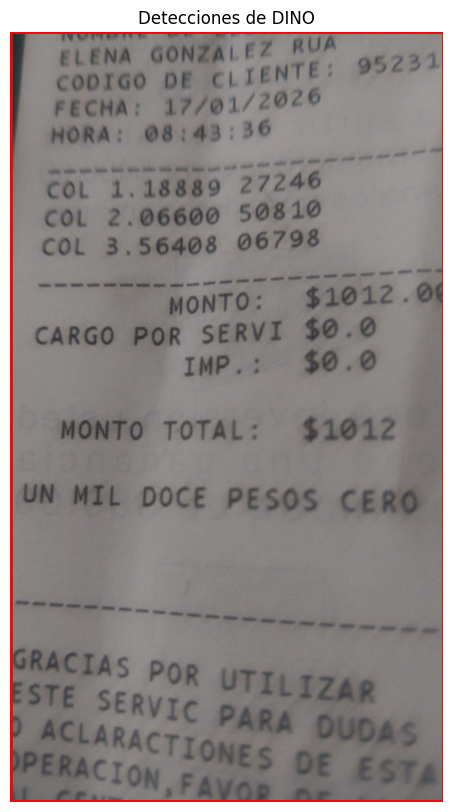

------------------------------------------------------------
Procesando: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet/20260121 imagenes Cashcollection/106.png
Generando máscaras SAM…


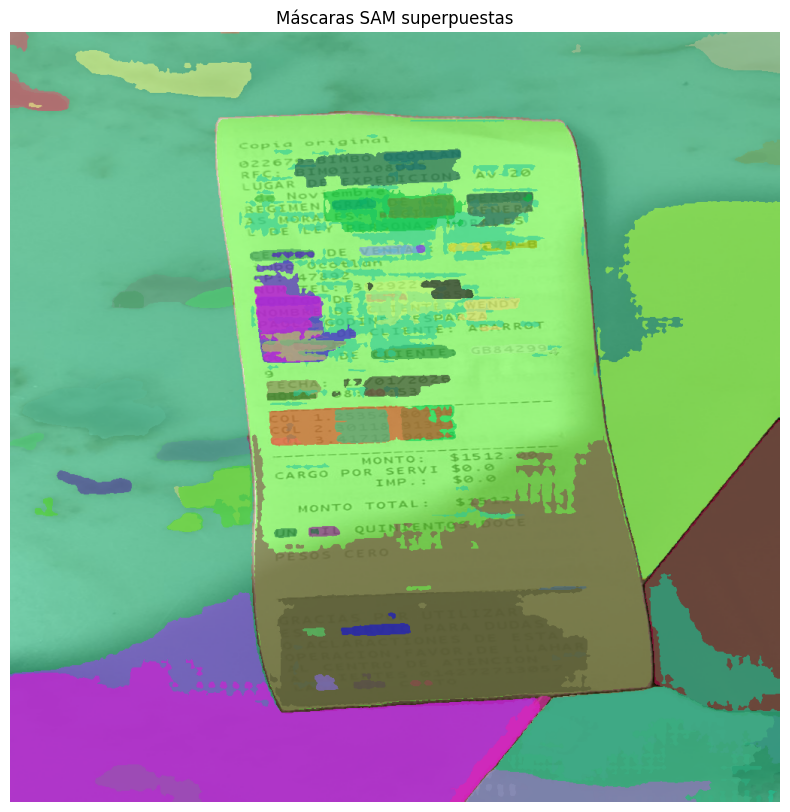

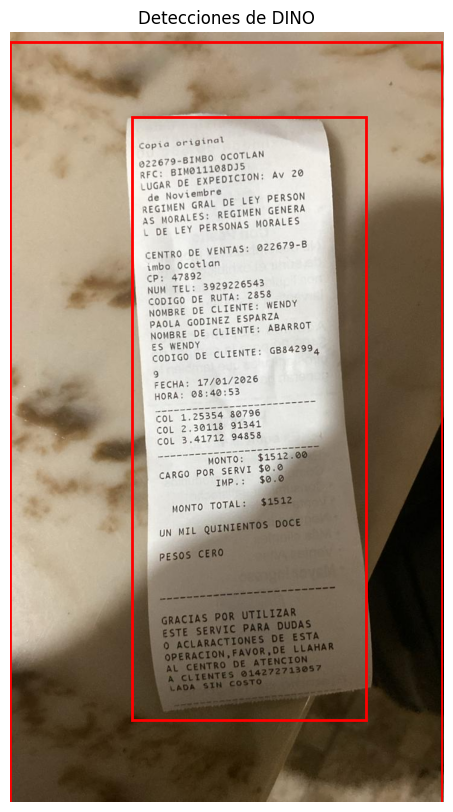

------------------------------------------------------------
Procesando: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/dataset_bimbonet/20260121 imagenes Cashcollection/107.png
Generando máscaras SAM…


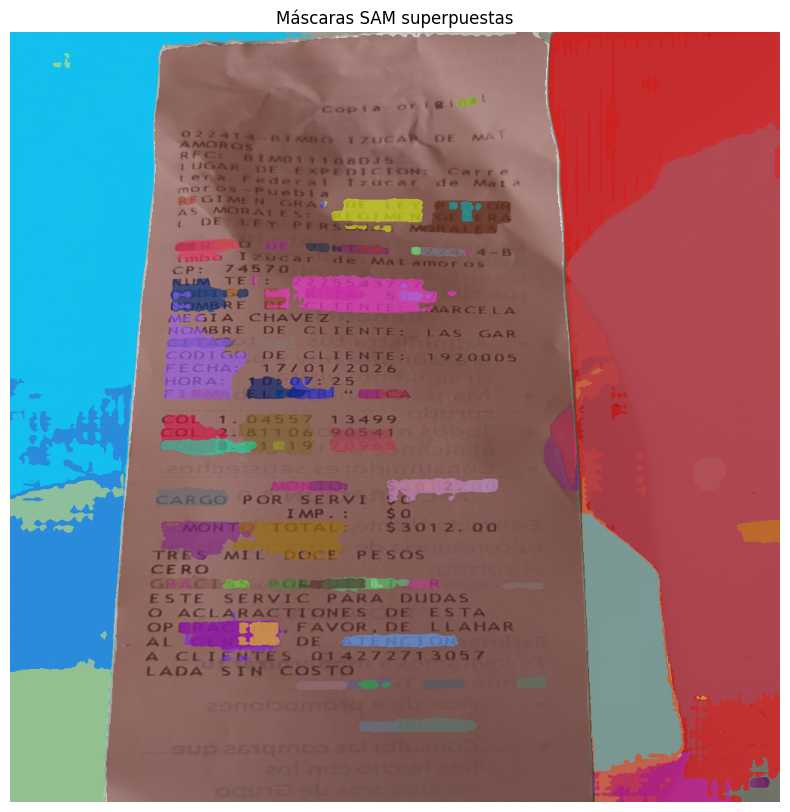

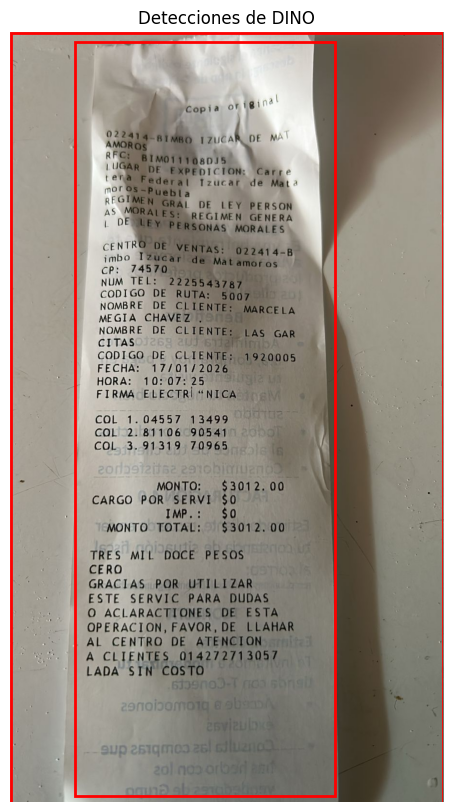

------------------------------------------------------------


In [ ]:
# Número de imágenes a procesar (puedes modificarlo)
N_TEST_IMAGES = 10

all_test_images = sorted([
    os.path.join(IMAGE_DIR, f)
    for f in os.listdir(IMAGE_DIR)
    if f.lower().endswith((".png", ".jpg", ".jpeg"))
])

test_images = all_test_images[:N_TEST_IMAGES]

print(f"Se seleccionaron {len(test_images)} imágenes de prueba.\n")

for img_path in test_images:
    print(f"Procesando: {img_path}")
    visualize_sam_masks(img_path)
    visualize_dino(img_path)
    print("-" * 60)

In [ ]:
import nbformat

input_nb = "/content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/Avance 4_Equipo 31-OCR+SAM.ipynb"     #nom original
output_nb = "/content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/Avance 4_Equipo 31-OCR+SAM_clean.ipynb"

# Cargar notebook
nb = nbformat.read(input_nb, as_version=4)

# Eliminar metadata corrupta si existe
if "widgets" in nb.get("metadata", {}):
    del nb["metadata"]["widgets"]

#limpiar cada celda
for cell in nb["cells"]:
    if "metadata" in cell and "widgets" in cell["metadata"]:
        del cell["metadata"]["widgets"]

# Guardar notebook limpio
with open(output_nb, "w", encoding="utf-8") as f:
    nbformat.write(nb, f)

print("Notebook limpio guardado como:", output_nb)

Notebook limpio guardado como: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/Avance 4_Equipo 31-OCR+SAM_clean.ipynb
